<a href="https://colab.research.google.com/github/dipto8103/-Agricultural-Sustainability-and-Crop-Recommendation-System-ASCRS-/blob/main/ReNewed_Soil_Classification_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Defining the train and test datasets:

In [ ]:
training_data_directory="train"
test_data_directory="test"

### Importing All libraries:

In [ ]:
import os
import re
import cv2
import time
import shutil
import zipfile
import random
import seaborn as sns
import urllib.request
import numpy as np
import tensorflow as tf
from PIL import Image
from os import listdir
from google.colab import drive
from os.path import isfile, join
import matplotlib.pyplot as plt
!pip install tensorflow
!pip install keras
!pip install opencv-python
!pip show tensorflow
!pip show keras
!pip show opencv-python
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout
from tensorflow.keras import mixed_precision


Name: tensorflow
Version: 2.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine-rl, tf_keras
Name: keras
Version: 2.15.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: 
Required-by: tensorflow
Name: opencv-python
Version: 4.8.0.76
Summary: Wrapper package for OpenCV python bindings.
Home-page: https://github.com/opencv/opencv-python
Author: 
Author-email

Defining directory paths:

In [ ]:
drive.mount('/content/drive')
train = os.path.join('/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/Datasets/soil_types/train')
test = os.path.join('/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/Datasets/soil_types/test')

Mounted at /content/drive


### Precprocessing:

Adding noise externally:

In [ ]:
def add_gaussian_noise(image):
    row, col, ch = image.shape
    mean = 0
    var = 0.00004
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    gauss = gauss.reshape(row, col, ch)
    noisy = image + gauss
    noisy_clipped = np.clip(noisy, 0, 255).astype(np.uint8)
    return noisy_clipped

def add_salt_and_pepper_noise(image):
    row, col, ch = image.shape
    s_vs_p = 0.5
    amount = 0.001
    out = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * s_vs_p).astype(int)
    coords = (np.random.randint(0, i, num_salt) for i in image.shape)
    out[tuple(coords)] = 255  # should be the max value in the image datatype
    # Pepper mode
    num_pepper = np.ceil(amount * image.size * (1. - s_vs_p)).astype(int)
    coords = (np.random.randint(0, i, num_pepper) for i in image.shape)
    out[tuple(coords)] = 0
    return out

Constructing filter to remove noises from image:

#### Optimising gabor filter

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enhance_brightness(image, factor=1.0):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hsv_image = np.array(hsv_image, dtype=np.float64)
    hsv_image[:, :, 2] = hsv_image[:, :, 2] * factor
    hsv_image[:, :, 2][hsv_image[:, :, 2] > 255] = 255
    hsv_image = np.array(hsv_image, dtype=np.uint8)
    return cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

def enhance_color(image, saturation_factor=1.0):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hsv_image = np.array(hsv_image, dtype=np.float64)
    hsv_image[:, :, 1] = hsv_image[:, :, 1] * saturation_factor
    hsv_image[:, :, 1][hsv_image[:, :, 1] > 255] = 255
    hsv_image = np.array(hsv_image, dtype=np.uint8)
    return cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)

def explore_gabor_parameters(image_path, kernel_sizes, sigmas, thetas, lambdas, gammas, psis, brightness_factors, saturation_factors):
    image = cv2.imread(image_path)
    num_combinations = len(kernel_sizes) * len(sigmas) * len(thetas) * len(lambdas) * len(gammas) * len(psis)
    num_enhancements = len(brightness_factors) * len(saturation_factors)
    num_rows = num_combinations
    num_cols = num_enhancements
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(300, 90))
    if num_enhancements == 1:
        axes = np.expand_dims(axes, axis=1)
    axes = axes.flatten()

    for idx, (bf, sf, ks, sigma, theta, lambd, gamma, psi) in enumerate(np.array(np.meshgrid(brightness_factors, saturation_factors, kernel_sizes, sigmas, thetas, lambdas, gammas, psis)).T.reshape(-1, 8)):
        brightened_image = enhance_brightness(image, bf)
        color_enhanced_image = enhance_color(brightened_image, sf)
        grayscale_image = cv2.cvtColor(color_enhanced_image, cv2.COLOR_BGR2GRAY)
        gabor_kernel = cv2.getGaborKernel((int(ks), int(ks)), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_64F)
        filtered_image = cv2.filter2D(grayscale_image, -1, gabor_kernel)
        ax = axes[idx]
        ax.imshow(filtered_image, cmap='gray')
        title = f"BF={bf}, SF={sf}, KS={ks}, Sigma={sigma:.2f}, Theta={theta:.2f}, Lambda={lambd}, Gamma={gamma}, Psi={psi}"
        ax.set_title(title, fontsize=8)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Set the parameter ranges for the Gabor filter
kernel_sizes = [3, 11,]
sigmas = [1.0, 4.0]
thetas = [0, np.pi / 2]
lambdas = [10, 30]
gammas = [0.5, 1.5]
psis = [0, np.pi / 2]
brightness_factors = [0.8, 1.2]
saturation_factors = [0.8, 1.2]

# Call the function with the image path and the parameter ranges
explore_gabor_parameters('/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/Datasets/soil_types/test/Black Soil/28.jpg', kernel_sizes, sigmas, thetas, lambdas, gammas, psis, brightness_factors, saturation_factors)


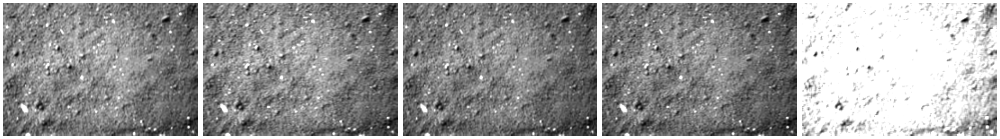

In [ ]:
# Define the enhancement functions
def enhance_brightness(image, factor=1.0):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hsv_image = np.array(hsv_image, dtype=np.float64)
    hsv_image[:,:,2] = hsv_image[:,:,2]*factor  # scale channel V (brightness)
    hsv_image[:,:,2][hsv_image[:,:,2]>255] = 255  # cap values at 255
    hsv_image = np.array(hsv_image, dtype=np.uint8)
    return cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)  # Convert back to BGR

def enhance_color(image, saturation_factor=1.0):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)  # Convert to HSV
    hsv_image = np.array(hsv_image, dtype=np.float64)
    hsv_image[:,:,1] = hsv_image[:,:,1]*saturation_factor  # scale channel S (saturation)
    hsv_image[:,:,1][hsv_image[:,:,1]>255] = 255  # cap values at 255
    hsv_image = np.array(hsv_image, dtype=np.uint8)
    return cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)  # Convert back to BGR

# Function to plot specific Gabor filter parameters
def plot_specific_gabor_parameters(image, params):
    fig, axs = plt.subplots(1, len(params), figsize=(30, 20))

    for idx, param in enumerate(params):
        bf, sf, ks, sigma, theta, lambd, gamma, psi = param
        # Apply brightness and color enhancements
        brightened_image = enhance_brightness(image, bf)
        color_enhanced_image = enhance_color(brightened_image, sf)
        # Convert the enhanced image to grayscale
        grayscale_image = cv2.cvtColor(color_enhanced_image, cv2.COLOR_BGR2GRAY)
        # Get Gabor kernel
        gabor_kernel = cv2.getGaborKernel((ks, ks), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_64F)
        # Apply Gabor filter to the grayscale image
        filtered_image = cv2.filter2D(grayscale_image, -1, gabor_kernel)
        # Plot the filtered image
        axs[idx].imshow(filtered_image, cmap='gray')
        axs[idx].set_title("")
        axs[idx].axis('off')

    plt.tight_layout()
    plt.show()

# Load the image
image_path = '/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/soil_classification/Random Image samples/Black Soil.jpg'
image = cv2.imread(image_path)

# Gabor filter parameters for the best results
params = [
    (0.8, 0.8, 3, 1.0, np.pi/2, 30.0, 1.5, 0.0),
    (0.8, 0.8, 3, 1.0, 0.0, 30.0, 1.5, 0.0),
    (0.8, 0.8, 3, 1.0, np.pi/2, 10.0, 1.5, 0.0),
    (0.8, 0.8, 3, 1.0, 0.0, 10.0, 1.5, 0.0),
    (0.8, 0.8, 3, 4.0, 0.0, 10.0, 0.5, 0.0)
]

# Plot the specific Gabor filter parameters
plot_specific_gabor_parameters(image, params)

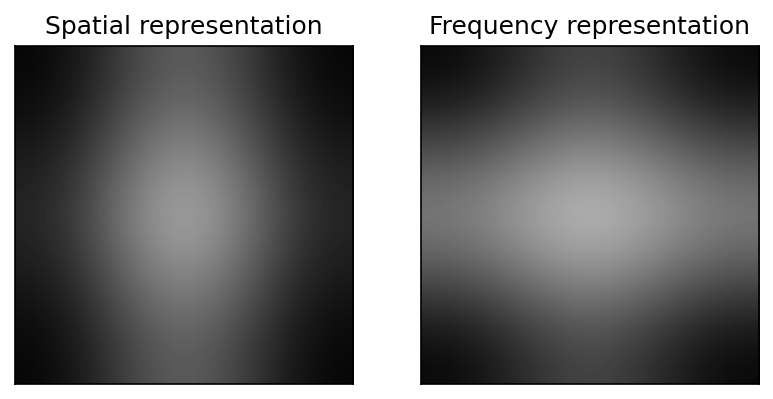

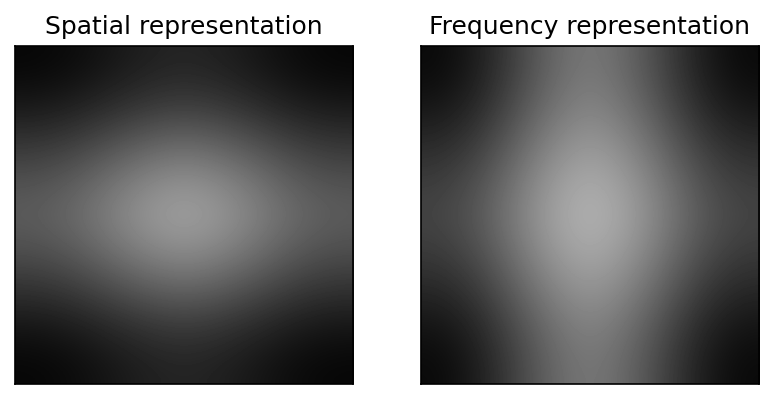

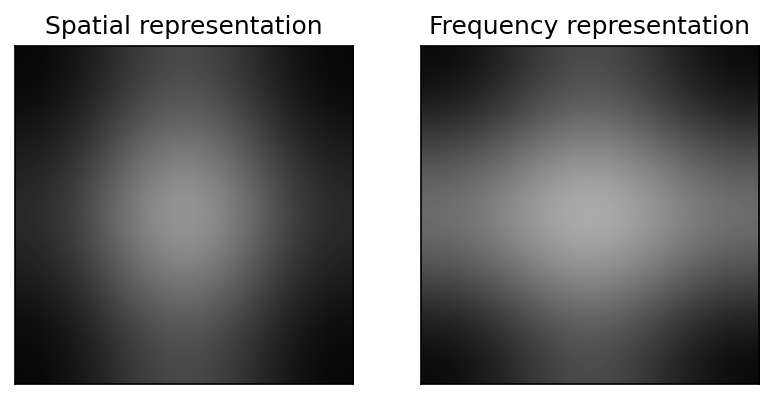

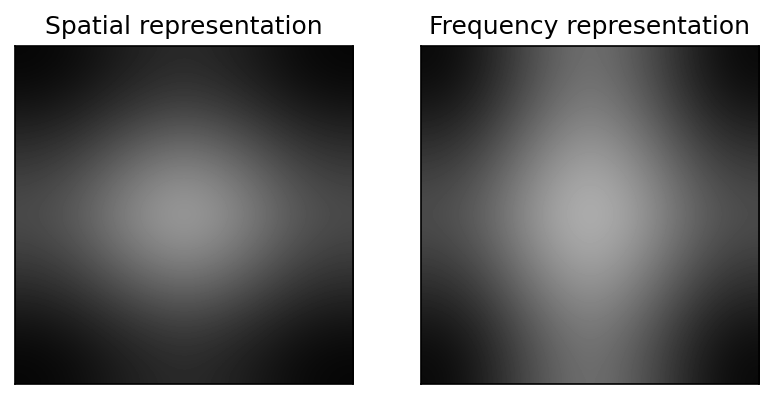

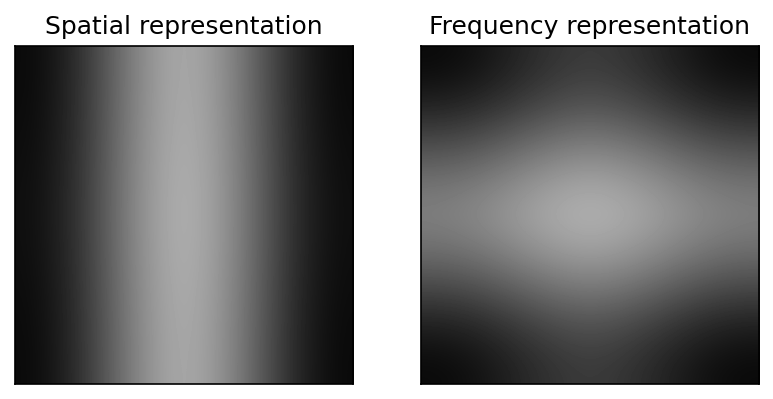

In [ ]:
def plot_gabor_filter_and_frequency(kernel_size, sigma, theta, lambd, gamma, psi, ktype):
    gabor_kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, lambd, gamma, psi, ktype=ktype)
    # Perform Fourier transform
    fshift = np.fft.fftshift(np.fft.fft2(gabor_kernel))
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    # Increase the figure resolution
    plt.figure(dpi=150)
    # Plot spatial representation with interpolation
    plt.subplot(121), plt.imshow(gabor_kernel, cmap='gray', interpolation='bicubic')
    plt.title('Spatial representation'), plt.xticks([]), plt.yticks([])
    # Plot frequency representation with interpolation
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray', interpolation='bicubic')
    plt.title('Frequency representation'), plt.xticks([]), plt.yticks([])
    plt.show()

# Parameters that provided the best results
params = [
    (3, 1.0, np.pi/2, 30.0, 1.5, 0.0, cv2.CV_64F),
    (3, 1.0, 0.0, 30.0, 1.5, 0.0, cv2.CV_64F),
    (3, 1.0, np.pi/2, 10.0, 1.5, 0.0, cv2.CV_64F),
    (3, 1.0, 0.0, 10.0, 1.5, 0.0, cv2.CV_64F),
    (3, 4.0, 0.0, 10.0, 0.5, 0.0, cv2.CV_64F)
]

# Plot each filter using the specified parameters
for p in params:
    plot_gabor_filter_and_frequency(*p)

#### defining other filters

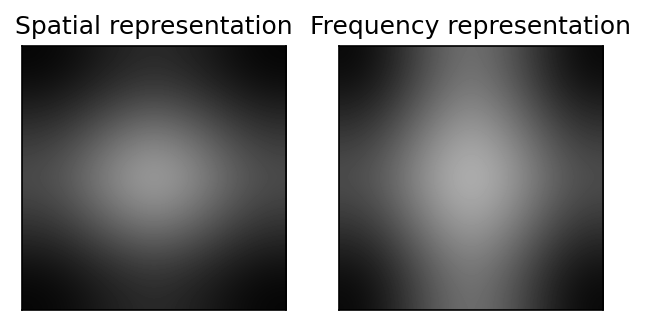

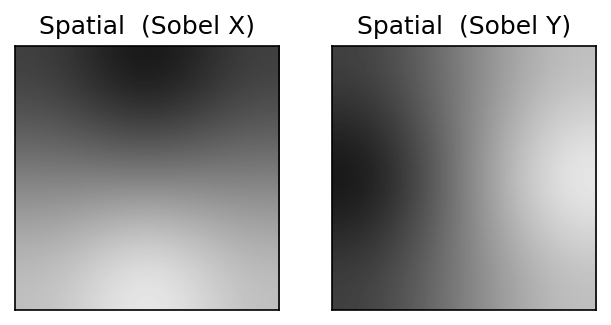

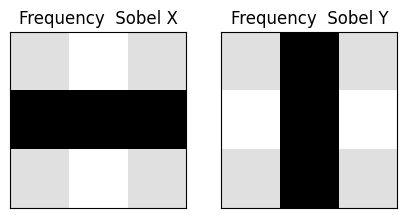

In [ ]:
def histogram_stretching(image):
    # Convert to grayscale for histogram stretching
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply histogram stretching
    stretched = cv2.normalize(gray, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    # Convert back to RGB
    return cv2.cvtColor(stretched, cv2.COLOR_GRAY2RGB)

def median_filtering(image, kernel_size=3):
    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply median blur
    filtered_image = cv2.medianBlur(image, kernel_size)
    return filtered_image

def apply_high_pass_filter(image):
    # Apply Gaussian blur to get the low-frequency components
    low_pass = cv2.GaussianBlur(image, (3, 3), 0)
    # Subtract the low-frequency components from the original image to get high-frequency components
    high_pass = cv2.subtract(image, low_pass)
    # Add back the original image to emphasize the high-frequency components
    high_boost = cv2.add(image, high_pass)
    return high_boost

def apply_low_pass_filter(image):
    if image is None:
        print("Warning: Received a None image in low pass.")
    else:
        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Convert the grayscale image back to BGR (color)
        bgr_image = cv2.cvtColor(gray_image, cv2.COLOR_GRAY2BGR)
        # Apply a Gaussian Blur with a 5x5 kernel and automatically calculated sigmaX to the color-converted image
        blurred_image = cv2.GaussianBlur(bgr_image, (5, 5), 0)
        return blurred_image

def high_boost_filter(image, alpha=1.5):
    # Ensure the input is a 3-channel grayscale image
    if image.shape[2] != 3:
        raise ValueError("Input image must have 3 channels.")
    # Since all channels are identical for a grayscale image, work with only one channel
    single_channel = image[:, :, 0]
    # Apply a low pass filter to the single channel
    low_pass = cv2.GaussianBlur(single_channel, (5, 5), 0)
    # Subtract the low-pass image from the original single channel image to get the high frequency component
    high_freq = cv2.subtract(single_channel, low_pass)
    # Convert single_channel and high_freq back to 3 channels before the next operation
    single_channel_3ch = cv2.merge([single_channel, single_channel, single_channel])
    high_freq_3ch = cv2.merge([high_freq, high_freq, high_freq])
    # Add the high frequency component back to the original image with an amplification factor
    high_boosted = cv2.addWeighted(single_channel_3ch, alpha, high_freq_3ch, 1 - alpha, 0)
    return high_boosted

def apply_contrast_stretching(image):
    if image is None:
        print("Warning: Received a None image in apply_contrast_stretching.")
        return None  # Return None or handle the case as appropriate
    else:
        # Proceed with the original code if the image is not None
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image
        min_val = np.min(gray_image)
        max_val = np.max(gray_image)
        if max_val > min_val:  # Prevent division by zero
            # Stretch contrast
            contrast_stretched_image = (gray_image - min_val) / (max_val - min_val) * 255
            contrast_stretched_image = contrast_stretched_image.astype(np.uint8)
        else:
            # Avoid changing the image if max_val equals min_val
            contrast_stretched_image = gray_image.copy()
        # Convert the single-channel grayscale image back to a 3-channel BGR image
        contrast_stretched_color_image = cv2.cvtColor(contrast_stretched_image, cv2.COLOR_GRAY2BGR)
        return contrast_stretched_color_image

'''   GABOR FILTER   '''

def apply_gabor_filter_to_grayscale(image, kernel_size=2, sigma=2.0, theta=np.pi/10, lambd=7, gamma=0, psi=2, ktype=cv2.CV_64F):
    # Convert the image to grayscale
    grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Get Gabor kernel
    gabor_kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, lambd, gamma, psi, ktype=ktype)
    filtered_image = cv2.filter2D(grayscale_image, -1, gabor_kernel)
    # Apply Gabor filter to the grayscale image
    filtered_image = cv2.normalize(filtered_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    color_image = cv2.cvtColor(filtered_image, cv2.COLOR_GRAY2BGR)
    return color_image

def plot_gabor_filter_and_frequency(kernel_size=3, sigma=1.0, theta=0, lambd=10, gamma=1.5, psi=0, ktype=cv2.CV_64F):
    gabor_kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, lambd, gamma, psi, ktype=ktype)
    # Perform Fourier transform
    fshift = np.fft.fftshift(np.fft.fft2(gabor_kernel))
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    # Increase the figure resolution
    plt.figure(figsize=(5, 15),dpi=150)
    # Plot spatial representation with interpolation
    plt.subplot(121), plt.imshow(gabor_kernel, cmap='gray', interpolation='bicubic')
    plt.title('Spatial representation'), plt.xticks([]), plt.yticks([])
    # Plot frequency representation with interpolation
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray', interpolation='bicubic')
    plt.title('Frequency representation'), plt.xticks([]), plt.yticks([])
    plt.show()
plot_gabor_filter_and_frequency(kernel_size=3, sigma=1, theta=0, lambd=10, gamma=1.5, psi=0, ktype=cv2.CV_64F)

def apply_sobel_filter_to_grayscale(image, ksize=3, scale=1, delta=0):
    # Convert the image to grayscale
    grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply Sobel filter in the x direction
    sobelx = cv2.Sobel(grayscale_image, cv2.CV_64F, 1, 0, ksize=ksize, scale=scale, delta=delta)
    # Apply Sobel filter in the y direction
    sobely = cv2.Sobel(grayscale_image, cv2.CV_64F, 0, 1, ksize=ksize, scale=scale, delta=delta)
    # Combine the two directional filters
    sobel_combined = cv2.sqrt(cv2.addWeighted(cv2.pow(sobelx, 2), 0.5, cv2.pow(sobely, 2), 0.5, 0))
    # Normalize the filtered image to span the full [0, 255] range
    sobel_normalized = cv2.normalize(sobel_combined, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # Convert the filtered grayscale image back to BGR color space
    color_image = cv2.cvtColor(sobel_normalized, cv2.COLOR_GRAY2BGR)
    return color_image

def plot_sobel_filter_and_frequency(ksize=3):
    # The Sobel filter coefficients for x and y direction
    sobelx = cv2.getDerivKernels(1, 0, ksize, normalize=True)[0] * cv2.getDerivKernels(1, 0, ksize, normalize=True)[1].T
    sobely = cv2.getDerivKernels(0, 1, ksize, normalize=True)[0] * cv2.getDerivKernels(0, 1, ksize, normalize=True)[1].T
    # Perform Fourier transform on the filters
    fshift_x = np.fft.fftshift(np.fft.fft2(sobelx))
    fshift_y = np.fft.fftshift(np.fft.fft2(sobely))
    magnitude_spectrum_x = 20 * np.log(np.abs(fshift_x) + 1e-5)  # Add a small constant before log
    magnitude_spectrum_y = 20 * np.log(np.abs(fshift_y) + 1e-5)  # Add a small constant before log
    # Plot the spatial domain representation
    plt.figure(figsize=(5, 5), dpi=150)
    plt.subplot(121), plt.imshow(sobelx, cmap='gray', interpolation='bicubic')
    plt.title('Spatial  (Sobel X)'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(sobely, cmap='gray', interpolation='bicubic')
    plt.title('Spatial  (Sobel Y)'), plt.xticks([]), plt.yticks([])
    plt.show()
    plt.figure(figsize=(5, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(magnitude_spectrum_x, cmap='gray')
    plt.title('Frequency  Sobel X'), plt.xticks([]), plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(magnitude_spectrum_y, cmap='gray')
    plt.title('Frequency  Sobel Y'), plt.xticks([]), plt.yticks([])
    plt.show()
plot_sobel_filter_and_frequency(ksize=3)


loading data after processing:

In [ ]:
# Custom preprocessing function that combines the above steps
def custom_preprocessing_function(image):
    image = add_salt_and_pepper_noise(image)
    #image = add_gaussian_noise(image)
    image = histogram_stretching(image)
    ##Using Filters to remove noise from image right here
    #image = median_filtering(image)
    #image = apply_high_pass_filter(image)
    #image = apply_gabor_filter_to_grayscale(image)
    image = apply_sobel_filter_to_grayscale(image)
    image = high_boost_filter(image, alpha=1.5)
    #image = apply_low_pass_filter(image)
    image = apply_contrast_stretching(image)
    image = image.astype('float64')
    image /= 255.0
    return image

training_data_processor = ImageDataGenerator(
    horizontal_flip=True,
    zoom_range=0.2,
    rotation_range=10,
    shear_range=0.2,
    height_shift_range=0.1,
    width_shift_range=0.1,
    preprocessing_function=custom_preprocessing_function
)

test_data_processor = ImageDataGenerator(
    preprocessing_function=custom_preprocessing_function
)

# Load data into Python
training_data = training_data_processor.flow_from_directory(
    train,
    target_size = (256, 256),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

testing_data = test_data_processor.flow_from_directory(
    test,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 109 images belonging to 5 classes.
Found 47 images belonging to 5 classes.


In [ ]:
def display_stretching_before_after_augmentation(generator, original_dir, batch_size=32, image_count=5):
    # Create a temporary generator with no augmentation to display original images
    temp_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
        original_dir,
        target_size=(256, 256),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )

    # Fetch a batch of original and augmented images
    original_batch = next(temp_generator)
    augmented_batch = next(generator)

    # Display the images and histograms
    fig, ax = plt.subplots(nrows=image_count, ncols=6, figsize=(30, image_count * 4))
    for i in range(0, image_count):
        # Show original images
        ax[i, 0].imshow(original_batch[0][i])
        ax[i, 0].title.set_text('Original')
        ax[i, 0].axis('off')

        # Show histogram stretched images
        stretched = histogram_stretching((original_batch[0][i] * 255).astype(np.uint8))
        ax[i, 1].imshow(stretched)
        ax[i, 1].title.set_text('Histogram Stretched')
        ax[i, 1].axis('off')

        # Show augmented images
        ax[i, 2].imshow(augmented_batch[0][i])
        ax[i, 2].title.set_text('Augmented')
        ax[i, 2].axis('off')

        # Plot histograms for the original image
        for channel, color in enumerate(['red', 'green', 'blue']):
            sns.histplot(original_batch[0][i][:, :, channel].flatten(), bins=20, color=color, ax=ax[i, 3], alpha=0.5, stat="density")
        ax[i, 3].title.set_text('Original RGB Histogram')
        ax[i, 3].set_xlim([0, 1])

        # Plot histograms for the histogram-stretched image
        for channel, color in enumerate(['red', 'green', 'blue']):
            sns.histplot(stretched[:, :, channel].flatten(), bins=20, color=color, ax=ax[i, 4], alpha=0.5, stat="density")
        ax[i, 4].title.set_text('Stretched RGB Histogram')
        ax[i, 4].set_xlim([0, 255])  # Adjusted for stretched images

        # Plot histograms for the augmented image
        for channel, color in enumerate(['red', 'green', 'blue']):
            sns.histplot(augmented_batch[0][i][:, :, channel].flatten(), bins=20, color=color, ax=ax[i, 5], alpha=0.5, stat="density")
        ax[i, 5].title.set_text('Augmented RGB Histogram')
        ax[i, 5].set_xlim([0, 1])

    plt.tight_layout()
    plt.show()

Found 47 images belonging to 5 classes.


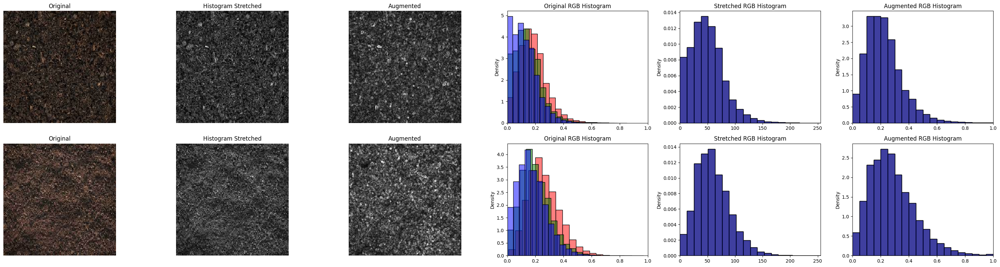

In [ ]:
display_stretching_before_after_augmentation(testing_data, test, batch_size=64, image_count=2)

### Model Building:

In [ ]:
# choose model parameters
num_conv_layers = 5
layer_size = 128
batch_size = 16
num_training_epochs = 40
MODEL_NAME = 'soil'

In [ ]:
# adding convolution layers and reducing dimentionality
mixed_precision.set_global_policy('mixed_float16')

# Build the model
model = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(256, 256, 3)),
    MaxPooling2D(2, 2),
    Dropout(0.2),

    Conv2D(32, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Dropout(0.2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Dropout(0.2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Dropout(0.2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Dropout(0.2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(5, activation='softmax', dtype='float32')  # Ensure the output layer dtype is float32
])


model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# use the data already Loaded previously to train/tune the model
history = model.fit(
    training_data,
    epochs=num_training_epochs,
    validation_data=testing_data,
    batch_size=batch_size  # Add the batch size here
)
# save the trained model
model.save(f'{MODEL_NAME}.h5')

The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


Epoch 1/40
4/4 [==============================] - 26s 7s/step - loss: 2.3329 - accuracy: 0.0826 - val_loss: 1.6105 - val_accuracy: 0.2128
Epoch 2/40
4/4 [==============================] - 23s 5s/step - loss: 1.6423 - accuracy: 0.2477 - val_loss: 1.6091 - val_accuracy: 0.2340
Epoch 3/40
4/4 [==============================] - 22s 6s/step - loss: 1.6115 - accuracy: 0.1927 - val_loss: 1.6093 - val_accuracy: 0.2340
Epoch 4/40
4/4 [==============================] - 22s 6s/step - loss: 1.6132 - accuracy: 0.1284 - val_loss: 1.6095 - val_accuracy: 0.1915
Epoch 5/40
4/4 [==============================] - 23s 5s/step - loss: 1.6121 - accuracy: 0.2018 - val_loss: 1.6092 - val_accuracy: 0.1915
Epoch 6/40
4/4 [==============================] - 23s 5s/step - loss: 1.6114 - accuracy: 0.2110 - val_loss: 1.6092 - val_accuracy: 0.1915
Epoch 7/40
4/4 [==============================] - 22s 5s/step - loss: 1.6131 - accuracy: 0.1560 - val_loss: 1.6090 - val_accuracy: 0.1915
Epoch 8/40
4/4 [==================

### Model Testing:

In [ ]:
!ls "/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/Datasets/soil_types/test/Cinder Soil/24.jpg"

'/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/Datasets/soil_types/test/Cinder Soil/24.jpg'


1/1 [==============================] - 0s 23ms/step
Predicted Soil Type: Yellow Soil
  True Soil Type: Yellow Soil
  Correct ?: True


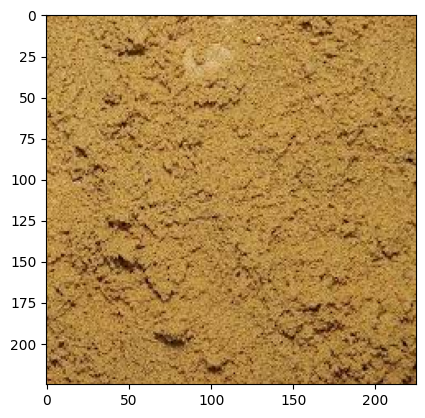

In [ ]:
def make_prediction(image_fp):
  im = cv2.imread(image_fp) # Load image
  if im is None:
    return f"Error: Unable to load the image at {image_fp}. Check the file path and access permissions."
  plt.imshow(im[:,:,[2,1,0]])
  img = image.load_img(image_fp, target_size = (256,256))
  img = image.img_to_array(img)

  image_array = img / 255. # scale the image
  img_batch = np.expand_dims(image_array, axis = 0)

  class_ = ["Black Soil", "Cinder Soil", "Laterite Soil", "Peat Soil", "Yellow Soil"] # possible output values
  predicted_value = class_[model.predict(img_batch).argmax() ]
  true_value = re.search(r'(Black Soil)|(Cinder Soil)|(Laterite Soil)|(Peat Soil)|(Yellow Soil)', image_fp)[0]

  out = f"""Predicted Soil Type: {predicted_value}
  True Soil Type: {true_value}
  Correct ?: {predicted_value == true_value}"""

  return out

test_image_filepath = r"/content/drive/MyDrive/MPSTME/SEM IV/Signal And Image Processing/PROJECT/Datasets/soil_types/test/Yellow Soil/23.jpg"
print(make_prediction(test_image_filepath))